In [14]:
# additional commant to show more results in one cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity='all'

In [2]:
# Quick utility to embed the videos below
from IPython.display import YouTubeVideo
def embed_video(index, playlist='PLYCpMb24GpOC704uO9svUrihl-HY1tTJJ'):
    return YouTubeVideo('', index=index - 1, list=playlist, width=600, height=350)

In [42]:
#embed_video(1)

In [3]:
# Address to Seattle webpage with data concerned to numbers of bicycles crossing the Fremont Bridge
url = 'https://data.seattle.gov/api/views/65db-xm6k/rows.csv?accessType=DOWNLOAD'

In [4]:
# file with data copied from given url and saved as given_name.csv file
from urllib.request import urlretrieve
urlretrieve(url, 'Fremont.csv')

('Fremont.csv', <http.client.HTTPMessage at 0x106751a90>)

In [5]:
# command in jupyter notebook to see some initial data in saved file
!head Fremont.csv

Date,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
01/31/2019 11:00:00 PM,7,6
01/31/2019 10:00:00 PM,13,16
01/31/2019 09:00:00 PM,18,27
01/31/2019 08:00:00 PM,32,33
01/31/2019 07:00:00 PM,40,94
01/31/2019 06:00:00 PM,68,246
01/31/2019 05:00:00 PM,106,399
01/31/2019 04:00:00 PM,84,219
01/31/2019 03:00:00 PM,60,97


In [6]:
# loading data file with Pandas
import pandas as pd
data = pd.read_csv('Fremont.csv')
data.shape
data.head()

(55488, 3)

,Date,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
0,01/31/2019 11:00:00 PM,7.0,6.0
1,01/31/2019 10:00:00 PM,13.0,16.0
2,01/31/2019 09:00:00 PM,18.0,27.0
3,01/31/2019 08:00:00 PM,32.0,33.0
4,01/31/2019 07:00:00 PM,40.0,94.0


In [17]:
# turning first column into DataFrame index and at the same time parsing string format to date format
data = pd.read_csv('Fremont.csv', index_col='Date', parse_dates=True)
data.head()
data.head(24).sum()

,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
Date,,
2019-01-31 23:00:00,7.0,6.0
2019-01-31 22:00:00,13.0,16.0
2019-01-31 21:00:00,18.0,27.0
2019-01-31 20:00:00,32.0,33.0
2019-01-31 19:00:00,40.0,94.0


Fremont Bridge East Sidewalk    1184.0
Fremont Bridge West Sidewalk    1976.0
dtype: float64

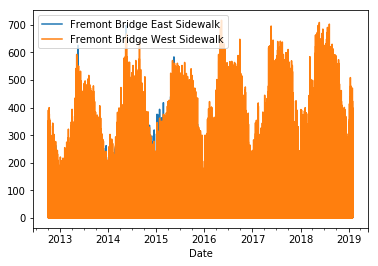

In [11]:
# turning to date format helps visualize the entire DataFrame with default
# frequency in hours - so the plot is really dense(7yearsx365x24)
data.plot();

,Fremont Bridge East Sidewalk,Fremont Bridge West Sidewalk
Date,,
2012-10-07,7297.0,6995.0
2012-10-14,8679.0,8116.0
2012-10-21,7946.0,7563.0
2012-10-28,6901.0,6536.0
2012-11-04,6408.0,5786.0


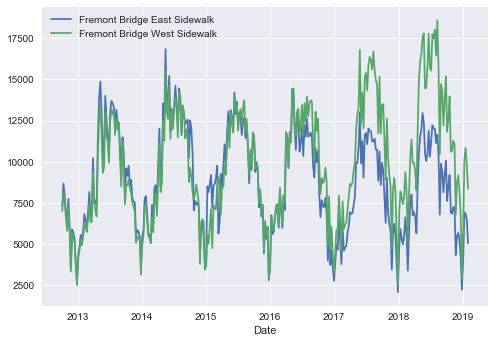

In [18]:
# resampling data to week frequency (counted by total rides for week)
data.resample('W').sum().head()
data.resample('W').sum().plot()

In [39]:
#embed_video(2)

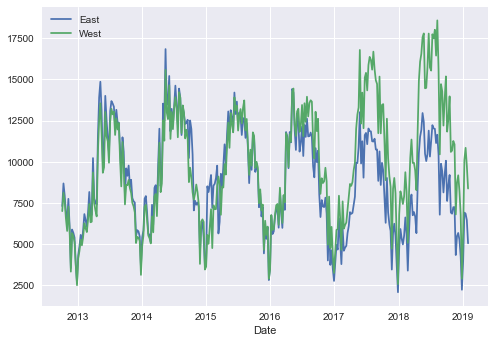

In [19]:
# using matplotlib and seaborn to improve quality of plot
import matplotlib.pyplot as plt
plt.style.use('seaborn')
# to make legend more concise
data.columns = ['East', 'West']
data.resample('W').sum().plot();

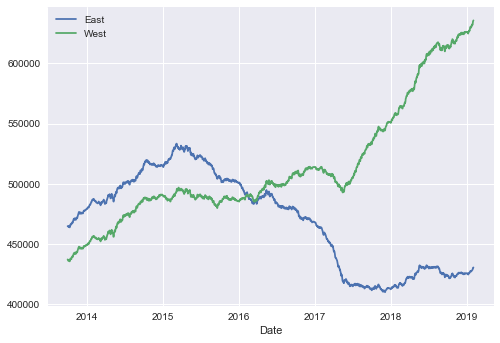

In [25]:
# to see yearly change trend first need to resample daily values with summing function, next
data.resample('D').sum().rolling(365).sum().plot()

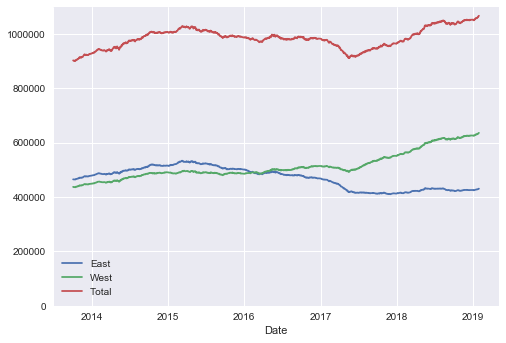

In [36]:
# because of y axis range the plot above look a little dramatic, so changing y axis range gives a more natural trend
# another thing to show is total trend of activities on the Fremont Bridge
data['Total'] = data['East'] + data['West']

ax = data.resample('D').sum().rolling(365).sum().plot()
ax.set_ylim(0, None);

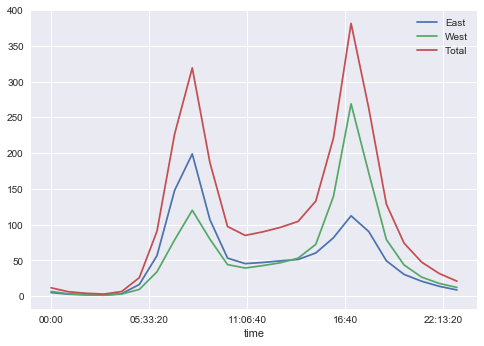

In [42]:
# grouping data by time units - from 00:00 (midnight) to 23:00 (11pm) with mean function to show average activity during
# 24 h day
# data.groupby(data.index.time).mean()
data.groupby(data.index.time).mean().plot();

In [49]:
# pivot_table() function makes new dataframe with index and columns coming from datatime variable and values of another
# variable inside the table
pivoted = data.pivot_table('Total', index=data.index.time, columns=data.index.date)
pivoted.iloc[:5,:5]

,2012-10-03,2012-10-04,2012-10-05,2012-10-06,2012-10-07
00:00:00,13.0,18.0,11.0,15.0,11.0
01:00:00,10.0,3.0,8.0,15.0,17.0
02:00:00,2.0,9.0,7.0,9.0,3.0
03:00:00,5.0,3.0,4.0,3.0,6.0
04:00:00,7.0,8.0,9.0,5.0,3.0


In [55]:
import cufflinks as cf
from plotly.offline import iplot
cf.go_offline()

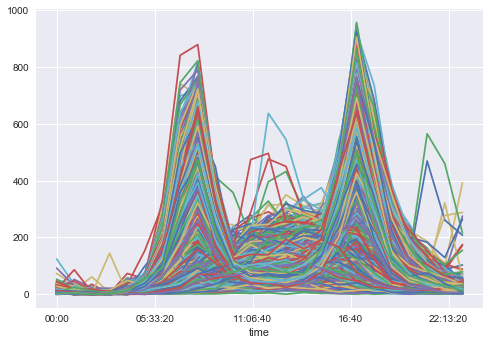

In [60]:
# plot showing lines for each day of 4 years (about 1500 lines) - not easy to see something         
pivoted.plot(legend=False);

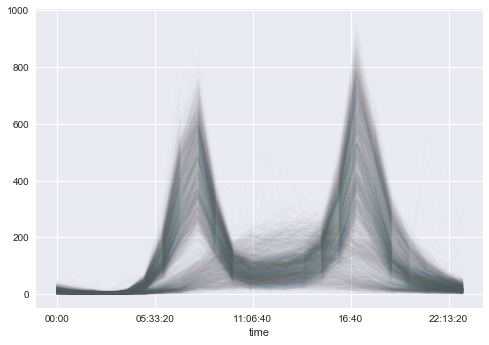

In [61]:
# plot showing lines for each day of 4 years with added transparency        
pivoted.plot(legend=False, alpha=.01);

In [58]:
# using cufflinks+plotly - loading quite long but ....interesting
#pivoted.iplot(kind='scatter')

In [62]:
#embed_video(3)